## The goal of this project is to use Neural Network autoencoder to build voter profile using Election results and census data for Quebec Provincial election

Census are a rich source of informations that could be leverage to identify meaningful trend in data usefull for election that don't rely on hacking Facebook or unreliable polls. However, there is plenty of feature that covaries and that are 

In [1]:
import re
import pandas as pd
import seaborn as sns
from numpy import linalg as LA
import glob
import sys

In [2]:

%pylab inline
%matplotlib inline


Populating the interactive namespace from numpy and matplotlib


In [3]:
def clean_header(header):
    cheader = []
    for i in range(0,len(header)):
        nh = header[i]
        h = header[i]
        if re.search("O.N.",h):nh = "ON"
        if re.search("P\.L\.Q\.",h):nh = "PLQ"
        if "C.A.Q.-.F.L." in h :nh = "CAQ"
        if re.search("Q\.S\.",h):nh = "QS"
        if re.search("P\.Q\.",h):nh = "PQ"
        if re.search("P.C.Q.",h):nh = "PCQ"
        if "B.P." in h:nh = "BP"
        if "Ind" in h:nh = "Ind"
        if "P.N." in h:nh = "PN"
        if "P.M.L.Q." in h:nh = "PMLQ"
        if "P.U.N." in h:nh = "PUN"
        if "P.S.P" in h:nh = "PSP"
        if " .A." in h:nh = "A"
        if "Q.R.D." in h:nh = "QRD"
        if "U.C.Q." in h:nh = "UCQ"
        if "P.q." in h:nh = "PEq"
        if "P.I." in h:nh = "PI"
        cheader.append(nh)
    return(cheader)

In [4]:
#Load Election data

#

AllFiles = glob.glob("/media/vince/datascience/election_project/subsection/*.csv")
AllData = dict()
c = 0

OtherParty = ["UCQ","QRD","PUN","PSP","PEq","PMLQ","BP","PN","Ind","A","PI"]

AllMuniNext = []

TotCir = dict()

for f in AllFiles:
    #Read Lines in file
    lines = [line.rstrip('\n') for line in open(f)]
    
    #Clean line from French carac
    lines = [line.decode('latin-1') for line in lines]
    lines = [line.encode('ascii',errors='ignore') for line in lines]
    
    #Get Header
    header = lines[0].split(";")
    
    #Clean header so that instead of Candidate and party, it is just party
    cheader = clean_header(header)
    #for zipped in zip(header,cheader):print(zipped)
        
    for l in lines[1:]:
        sp = l.split(";")
        if len(sp) != len(cheader):
            continue
        
        if len(sp[4].split(",")) != 2:
            AllMuniNext.append(sp[4])
            continue
        c += 1
        AllData[c] = dict()
        for (h,v) in zip(cheader,sp):
            if re.search("^\d+$",v):
                v = float(v)
                
            #Merge other
            if h in OtherParty:
                h = "Other"
                
            #Drop last letter of muni
            if h == "Nom des Municipalits":
                vsp = v.split(",")
                if len(vsp) != 2:
                    continue
                
                v = vsp[0]
            AllData[c][h] = v
        #AllData[c]["Circonscription"] = str(f.split("/")[-1].split(".")[0].split("_")[0])
#I am ignoring a lot of bureau de vote par anticipation or hors circonstription
#The goal is to first get voter profile
print(pd.Series(AllMuniNext).value_counts())

Total de la circonscription                   125
BVA6                                          125
Vote hors Qubec                               125
Vote des dtenus                               125
Vote au bureau du directeur du scrutin        125
BVA2                                          125
BVA3                                          125
Vote hors circonscription                     125
BVA5                                          125
Vote itinrant et au domicile de l'lecteur     124
Vote en installation d'hbergement             124
BVA1                                          124
BVA7                                          123
BVA8                                          123
BVA9                                          123
BVA4                                          123
BVA11                                         122
BVA12                                         122
BVA10                                         122
BVA13                                         121


In [5]:
#Transform in Pandas Dataframe
AllElection = pd.DataFrame(AllData).transpose().dropna()
print(len(AllElection))
#Remove region can't find non-voter
AllElection = AllElection[AllElection[".I."] != 0]
print(len(AllElection))
AllElection = AllElection[AllElection["B.V."]+AllElection["B.R."]<=AllElection[".I."]]
print(len(AllElection))

17730
16705
16704


In [6]:
#Create the abstentation voter
AllElection["Abst"] = AllElection[".I."] - (AllElection["B.V."]+AllElection["B.R."]) 

In [7]:
MajorParty = ["PLQ","QS","CAQ","PQ","Abst"]

OtherParty = ["Other"]

#Make sure I don't forget anything
for c in list(AllElection.columns):
    if c in MajorParty:continue
    if c in OtherParty:continue
    print(c)
    #print(AllElection[c].value_counts())
    


.I.
B.R.
B.V.
Circonscription
Code
Date scrutin
Nom des Municipalits
Regroupement
S.V.
Secteur
tendue


In [8]:
s = AllElection[MajorParty].sum().sort_values(ascending=False)
print(s)
print(s/s.sum()*100)

Abst    2713099.0
PLQ     1098630.0
CAQ      781916.0
PQ       637297.0
QS       242978.0
dtype: float64
Abst    49.564097
PLQ     20.070260
CAQ     14.284389
PQ      11.642424
QS       4.438830
dtype: float64


In [9]:
#PLQ->1,757,071->41.52
#PQ ->1,074,120->25.38
#CAQ->  975,607->23.05
#QS ->  323,124-> 7.63
#Abs->
#All->4,232,262->71.44
#RV ->6,012,440

#There is a lot of non-match, because of vote outside of city

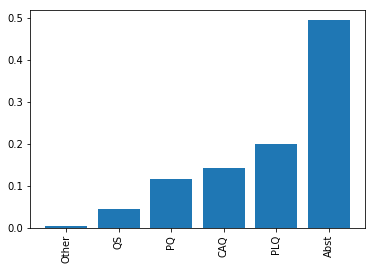

In [10]:
#Total Vote
TotVote = AllElection[MajorParty+OtherParty].sum().sort_values()
plt.bar(range(0,len(TotVote)),TotVote/sum(TotVote))
plt.xticks(range(0,len(TotVote)),list(TotVote.index),rotation=90)
plt.show()

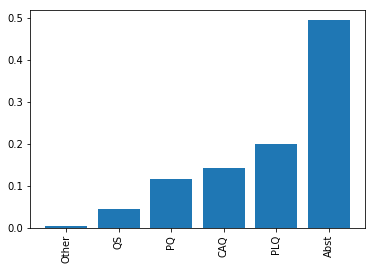

In [11]:
#Total Vote

MajorPartyOther = MajorParty +["Other"]
AllElection[MajorPartyOther] = AllElection[MajorPartyOther].astype(float)
TotVote = AllElection[MajorPartyOther].sum().sort_values()
plt.bar(range(0,len(TotVote)),TotVote/sum(TotVote))
plt.xticks(range(0,len(TotVote)),list(TotVote.index),rotation=90)
plt.show()

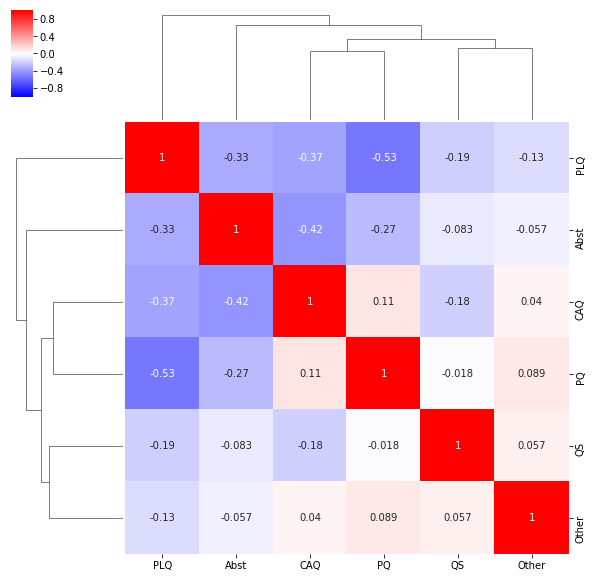

In [12]:
#Look at correlation for sub
SubMat = AllElection[MajorPartyOther].astype(float)
SubMat = SubMat.div(SubMat.sum(axis=1), axis=0).dropna()
sns.clustermap(SubMat.corr(),vmin=-1,vmax=1,cmap="bwr",annot=True)
plt.show()

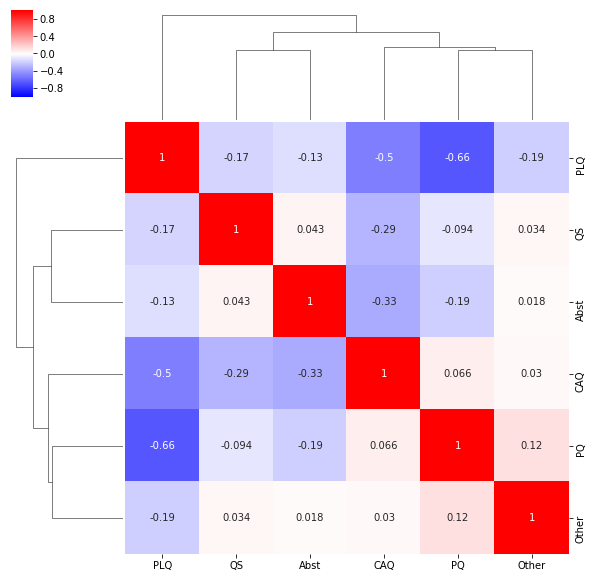

In [13]:
#Look at correlation for cir
SubMat = AllElection.groupby(by="Circonscription").sum()[MajorPartyOther]
SubMat = SubMat.div(SubMat.sum(axis=1), axis=0).dropna()
sns.clustermap(SubMat.corr(),vmin=-1,vmax=1,cmap="bwr",annot=True)
plt.show()




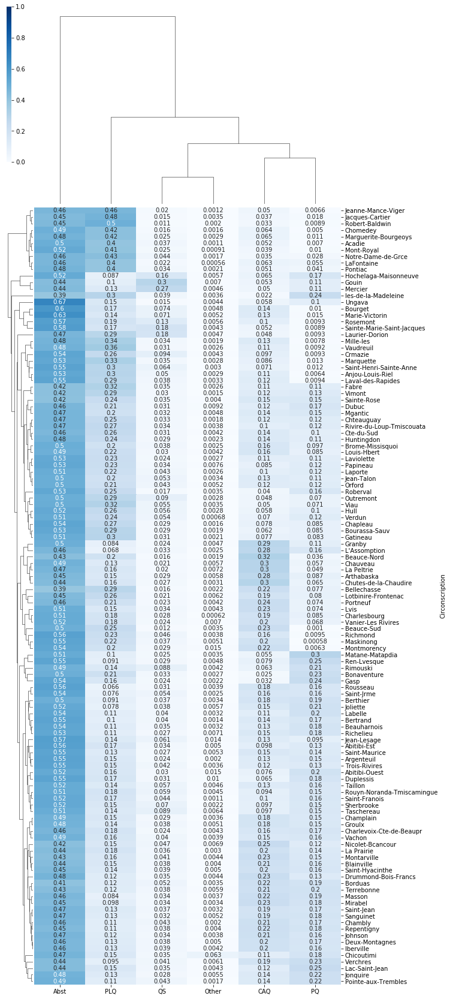

In [14]:
sns.clustermap(SubMat,vmin=0,vmax=1,cmap="Blues",annot=True,figsize=(10,30))
plt.show()

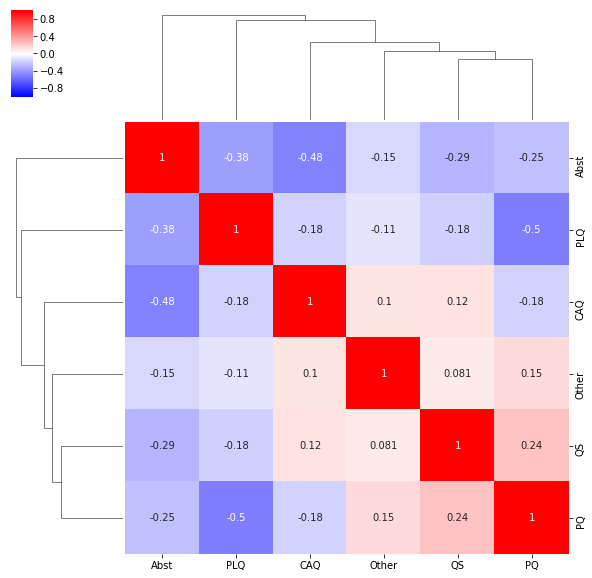

In [15]:
#Look at correlation for cir
SubMat = AllElection.groupby(by="Nom des Municipalits").sum()[MajorPartyOther]
Muni = SubMat.div(SubMat.sum(axis=1), axis=0).dropna()
sns.clustermap(Muni.corr(),vmin=-1,vmax=1,cmap="bwr",annot=True)
plt.show()



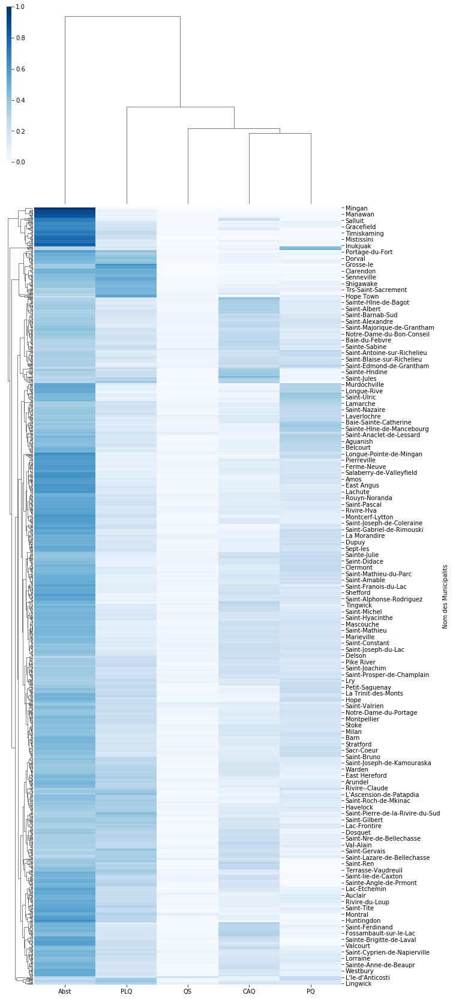

In [16]:
sns.clustermap(Muni[MajorParty],vmin=0,vmax=1,cmap="Blues",figsize=(10,30))
plt.show()

In [17]:
BigFile = pd.read_csv("./rece/98-401-X2016034_QUEBEC_Francais_CSV_data.csv")

/media/vince/anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [18]:
BigFile['Dim: Sexe (3): Membre ID: [1]: Total - Sexe'] = pd.to_numeric(BigFile['Dim: Sexe (3): Membre ID: [1]: Total - Sexe'],errors="coerce")

In [19]:
BigFile.head()

,ANNEE_DE_RECENSEMENT,CODE_GÉO (LDR),NIVEAU_GÉO,NOM_GÉO,TGN,TGN_FL,INDICATEUR_QUALITÉ_DONNÉES,CODE_GÉO_ALT,DIM: Profil des aires de diffusion (1678),Membre ID: Profil des aires de diffusion (1678),Notes: Profil des aires de diffusion (1678),Dim: Sexe (3): Membre ID: [1]: Total - Sexe,Dim: Sexe (3): Membre ID: [2]: Sexe masculin,Dim: Sexe (3): Membre ID: [3]: Sexe féminin
0,2016,1,0,Canada,4.0,5.1,20000,1,"Population, 2016",1,1.0,35151728.0,...,...
1,2016,1,0,Canada,4.0,5.1,20000,1,"Population, 2011",2,2.0,33476688.0,...,...
2,2016,1,0,Canada,4.0,5.1,20000,1,"Variation en pourcentage de la population, 201...",3,NaN,5.0,...,...
3,2016,1,0,Canada,4.0,5.1,20000,1,Total des logements privés,4,3.0,15412443.0,...,...
4,2016,1,0,Canada,4.0,5.1,20000,1,Logements privés occupés par des résidents hab...,5,4.0,14072079.0,...,...


In [20]:
BigFile=BigFile.dropna(subset=['Dim: Sexe (3): Membre ID: [1]: Total - Sexe'])

In [32]:


BigDF = BigFile.drop_duplicates(subset=["NOM_GÉO","DIM: Profil des aires de diffusion (1678)"]).pivot(index='NOM_GÉO', columns='DIM: Profil des aires de diffusion (1678)', values='Dim: Sexe (3): Membre ID: [1]: Total - Sexe')


In [33]:
BigDF["Nom des Municipalits"] = list(BigDF.index)

In [34]:
BigDF.dropna()

DIM: Profil des aires de diffusion (1678),% de ménages locataires consacrant 30 % ou plus de leur revenu aux frais de logement,% de ménages locataires dans un logement subventionné,% de ménages propriétaires avec hypothèque,% de ménages propriétaires consacrant 30 % ou plus de leur revenu aux frais de logement,0 à 14 ans,0 à 17 ans,0 à 17 ans (%),0 à 4 ans,0 à 5 ans,0 à 5 ans (%),...,Égyptien,Émirats arabes unis,Équatorien,Érythrée,Érythréen,États-Unis,Éthiopie,Éthiopien,Éwé,Nom des Municipalits
NOM_GÉO,,,,,,,,,,,,,,,,,,,,,
Abercorn,0.0,0.0,37.9,0.0,30.0,45.0,11.1,5.0,10.0,0.0,...,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,Abercorn
Abitibi,26.8,7.8,55.1,8.1,4285.0,4890.0,10.5,1425.0,1665.0,9.6,...,10.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,Abitibi
Abitibi-Ouest,27.4,10.4,52.1,8.4,3490.0,4105.0,12.5,1115.0,1375.0,11.3,...,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,Abitibi-Ouest
Acton,29.2,9.0,58.3,10.6,2630.0,3180.0,17.0,815.0,1010.0,16.8,...,0.0,0.0,0.0,0.0,0.0,30.0,0.0,0.0,0.0,Acton
Acton Vale,29.2,7.3,55.3,10.5,1170.0,1455.0,18.2,335.0,430.0,18.6,...,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,Acton Vale
Adstock,14.3,0.0,48.5,8.1,455.0,535.0,6.5,160.0,195.0,5.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adstock
Akulivik,6.5,90.3,0.0,0.0,250.0,290.0,22.4,85.0,110.0,22.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Akulivik
Albanel,0.0,23.1,60.4,10.3,400.0,480.0,8.3,120.0,150.0,6.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Albanel
Alma,29.5,11.5,60.4,9.3,4825.0,5745.0,11.6,1500.0,1825.0,11.0,...,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,Alma


In [35]:
Muni["Nom des Municipalits"] = list(Muni.index)
Merge = BigDF.merge(Muni,on="Nom des Municipalits")

In [36]:
scolarite = pd.read_csv("rece/98-402-X2016010-T1-SDR-fra.csv")
scolarite = scolarite[scolarite["Nom géographique, province ou territoire"] == "Québec"]
scolarite = scolarite[scolarite["Âge"] == "25 à 64"]


In [37]:
arr = [list(scolarite[scolarite["Sexe"] == "Sexe fémin"]["Nom géographique"])]
tname = ["Nom des Municipalits"]
AllSchool = []
for (s,ns) in zip(["Sexe fémin","Sexe masculin"],["fem","mal"]):
    print(ns)
    subscol = scolarite[scolarite["Sexe"] == s]
    print(len(subscol))
    for (t,nt) in zip(scolarite.columns[-6:],["no_degree","high_school","metier","cegep","inf_bac","bac+"]):
         
        lst = list(np.array(subscol[t]/100.0).astype('float64'))
        #lst = [float(i) for i in list(subscol[t]/100.0)]
        arr.append(lst)
        tname.append(ns+"_"+nt)
reformatscol = pd.DataFrame(arr).transpose()
reformatscol.columns = tname
reformatscol[tname[1:]] = reformatscol[tname[1:]].astype(float)


print(reformatscol.sort_values(by=tname[-1],ascending=False).head(10))
AllSchool = tname[1:]

fem
179
mal
179
           Nom des Municipalits  fem_no_degree  fem_high_school  fem_metier  \
99                    Westmount          0.009            0.076       0.019   
103                  Mont-Royal          0.025            0.074       0.034   
102                   Hampstead          0.025            0.096       0.034   
107                Beaconsfield          0.016            0.099       0.033   
100              Montréal-Ouest          0.011            0.086       0.023   
72                Saint-Lambert          0.029            0.083       0.057   
106                    Kirkland          0.022            0.161       0.055   
101              Côte-Saint-Luc          0.036            0.131       0.057   
161                     Chelsea          0.025            0.124       0.036   
74   Saint-Bruno-de-Montarville          0.028            0.131       0.095   

     fem_cegep  fem_inf_bac  fem_bac+  mal_no_degree  mal_high_school  \
99       0.121        0.037     0.738    

In [38]:
Merge = Merge.merge(reformatscol,on="Nom des Municipalits")

In [39]:
Merge = Merge[Merge["Population, 2016"] > 100].dropna(subset=["Population, 2016"])

In [40]:
#Thing I care
#Age
Merge["20-29_ans"] = Merge["20 à 24 ans"]+Merge["25 à 29 ans"]
Merge["30-39_ans"] = Merge["30 à 34 ans"]+Merge["35 à 39 ans"]
Merge["40-49_ans"] = Merge["40 à 44 ans"]+Merge["45 à 49 ans"]
Merge["50-59_ans"] = Merge["50 à 54 ans"]+Merge["55 à 59 ans"]
Merge["60-69_ans"] = Merge["60 à 64 ans"]+Merge["65 à 69 ans"]
Merge["70-79_ans"] = Merge["70 à 74 ans"]+Merge["75 à 79 ans"]
Merge["80-100_ans"] = Merge["80 à 84 ans"]+Merge["85 ans et plus"]

AllAge = ["20-29_ans","30-39_ans","40-49_ans","50-59_ans","60-69_ans","70-79_ans","80-100_ans"]
SumAge = Merge[AllAge].sum(axis=1)
Merge = Merge[SumAge > 100]
SumAge = Merge[AllAge].sum(axis=1)
for t in AllAge:
    Merge[t] = Merge[t]/SumAge

In [41]:
#Salaire
Merge["salaire_0_10"] = Merge["Moins de 10 000 $ (comprend les pertes)"]
Merge["salaire_10_30"] = Merge["10 000 $ à 19 999 $"]+Merge["20 000 $ à 29 999 $"]
Merge["salaire_30_50"] = Merge["30 000 $ à 39 999 $"]+Merge["40 000 $ à 49 999 $"]
Merge["salaire_50_70"] = Merge["50 000 $ à 59 999 $"]+Merge["60 000 $ à 69 999 $"]
Merge["salaire_70_90"] = Merge["70 000 $ à 79 999 $"]+Merge["80 000 $ à 89 999 $"]
Merge["salaire_90_inf"] = Merge["90 000 $ à 99 999 $"]+Merge["100 000 $ et plus"]

AllSalaire = ["salaire_0_10","salaire_10_30","salaire_30_50","salaire_50_70","salaire_70_90","salaire_90_inf"]
SumSal = Merge[AllSalaire].fillna(0).sum(axis=1)
for t in AllSalaire:
    Merge[t] = Merge[t].fillna(0)/SumAge


In [42]:
#Langue
Lang = ["Français","Anglais","Langue non officielle","Immigrants"]

#Norm
AllLang = []
for (t,nt) in zip(Lang,["francais","anglais","lang_non_off","immigrant"]):
    Merge[nt+"_norm"] = Merge[t] / Merge["Population, 2016"]
    AllLang.append(nt+"_norm")
    



    
Marr = ["Couples avec enfants","Couples en union libre","Couples mariés","Couples sans enfants"]
AllMarr = []
for (t,nt) in zip(Marr,["couple_kid","couple_union_libre","couple_marrie","couple_no_child"]):
    Merge[nt+"_norm"] = Merge[t] / Merge["Population, 2016"]
    AllMarr.append(nt+"_norm")



Imm = ["Non-immigrants","Immigrants"]

In [43]:
#Propriétaire
Merge["prop_norm"] = Merge["Propriétaire"] / Merge["Population, 2016"]

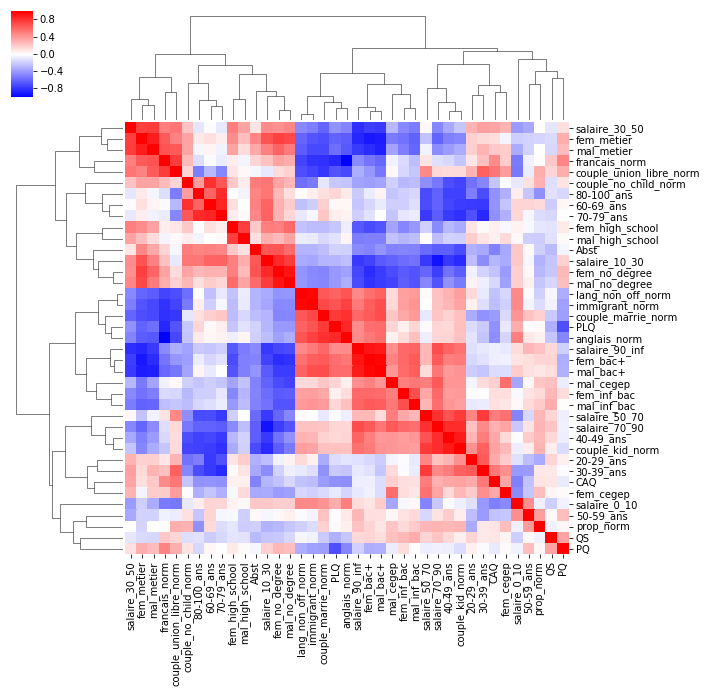

In [44]:
sns.clustermap(Merge[MajorParty+AllAge+AllLang+AllMarr+["prop_norm"]+AllSalaire+AllSchool].corr().dropna(),cmap="bwr",vmin=-1,vmax=1)

In [45]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD
from keras.constraints import *

In [46]:

subdf = Merge[MajorParty+AllAge+AllLang+AllMarr+["prop_norm"]+AllSalaire+AllSchool]


In [47]:
#Build X_train and y_train

y_train = subdf.as_matrix()

x_train = []
for i in range(0,len(subdf)):
    vect = [0]*len(subdf)
    vect[i] = 1
    x_train.append(vect)


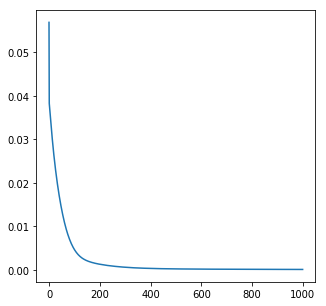

In [48]:

model = Sequential()

Number_elector = 20

zero_cst = min_max_norm(min_value=0.0, max_value=1.0, rate=1.0, axis=0)
zero_one = non_neg()

model.add(
    Dense(units=Number_elector, input_dim=len(subdf),kernel_constraint=zero_one,use_bias=False)
    )

model.add(
    Dense(len(subdf.columns),kernel_constraint=zero_one,use_bias=False)
)


model.compile(optimizer=keras.optimizers.Adam(),loss='mean_squared_error')

hist= model.fit(x_train, y_train, epochs=1000,verbose=0,batch_size=100)


figsize(5,5)
los = hist.history["loss"]
plt.plot(range(0,len(los)),los)
plt.show()

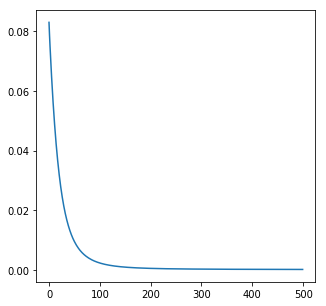

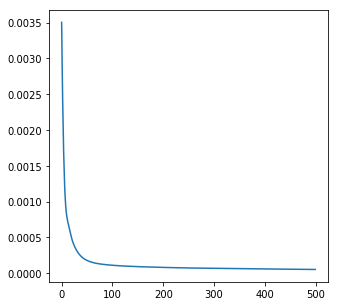

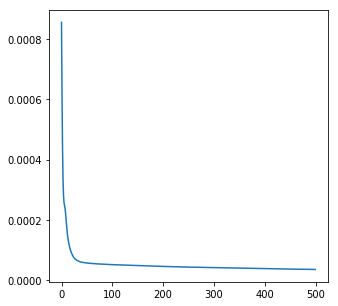

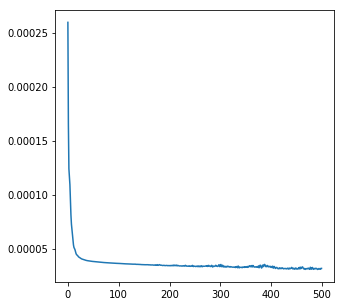

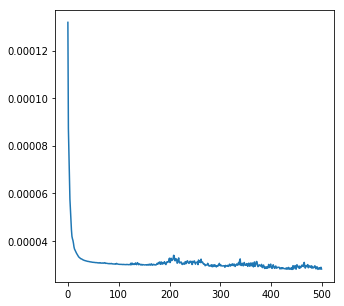

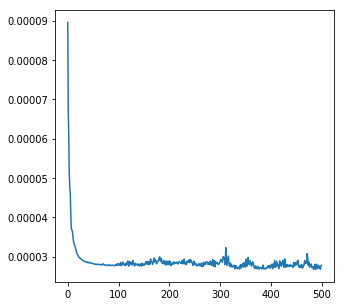

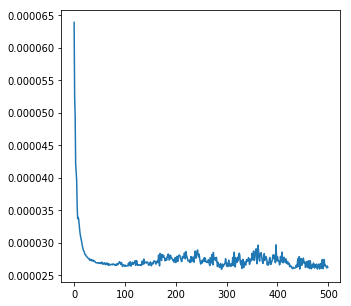

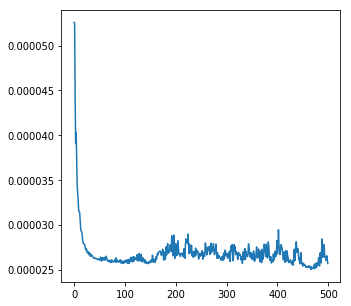

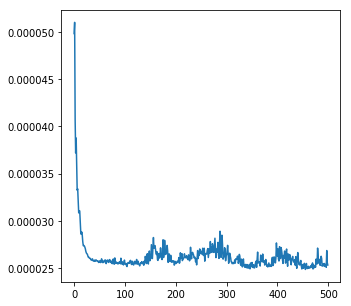

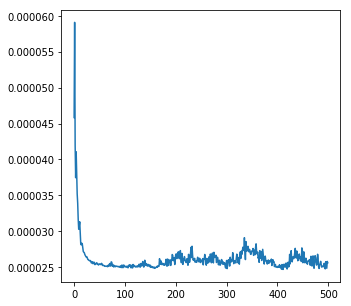

In [49]:
#Make lim
Lim = [0,len(MajorParty)]


for k in range(0,10):
    layw = model.layers[1].get_weights()
    #MajorParty+AllAge+AllLang+AllMarr+["prop_norm"]+AllSalaire+AllSchool
    for i in range(Number_elector):
        #np.sum(MajorParty) == 1
        layw[0][i][0:len(MajorParty)] = layw[0][i][0:len(MajorParty)]/np.sum(layw[0][i][0:len(MajorParty)])
        
        #np.sum(MajorParty) == 1
        t = [len(MajorParty),len(MajorParty)+len(AllAge)]
        layw[0][i][t[0]:t[1]] = layw[0][i][t[0]:t[1]]/np.sum(layw[0][i][t[0]:t[1]])
        
        #School
        layw[0][i][-len(AllSchool):] = layw[0][i][-len(AllSchool):]/np.sum(layw[0][i][-len(AllSchool):])*2.0
        
        #Salaire
        t = [len(AllSchool)+len(AllSalaire),len(AllSchool)]
        layw[0][i][-t[0]:-t[1]] = layw[0][i][-t[0]:-t[1]]/np.sum(layw[0][i][-t[0]:-t[1]])
        
    model.layers[1].set_weights(layw)
    #sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
    
    model.compile(optimizer=keras.optimizers.Adam(),loss='mean_squared_error')

    hist= model.fit(x_train, y_train, epochs=500,verbose=0,batch_size=100)
    
    
    figsize(5,5)
    los = hist.history["loss"]
    plt.plot(range(0,len(los)),los)
    plt.show()

In [50]:
VotProfile = dict()
c = 0
for lay in model.layers[1].get_weights()[0]:
    #print(lay)
    c += 1
    VotProfile["Voter_"+str(c)] = dict()
    for (v,i) in zip(lay,list(subdf.columns)):
        VotProfile["Voter_"+str(c)][i] =v
    

In [51]:
VotProfileDF = pd.DataFrame(VotProfile).transpose()

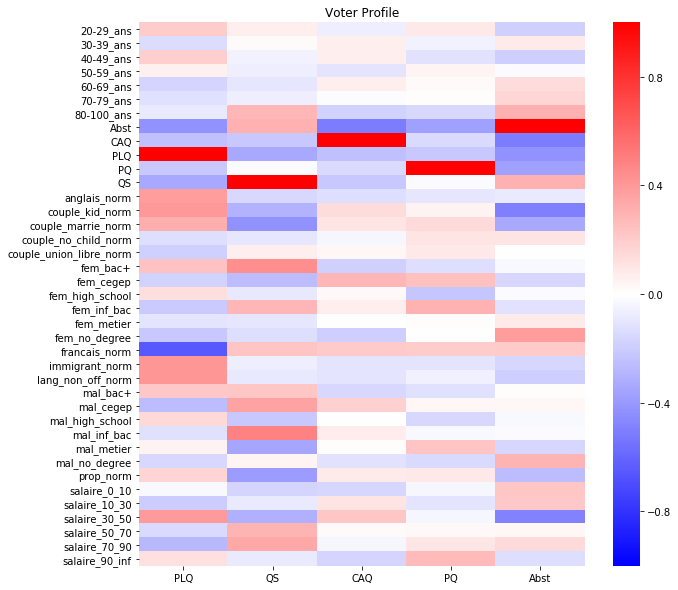

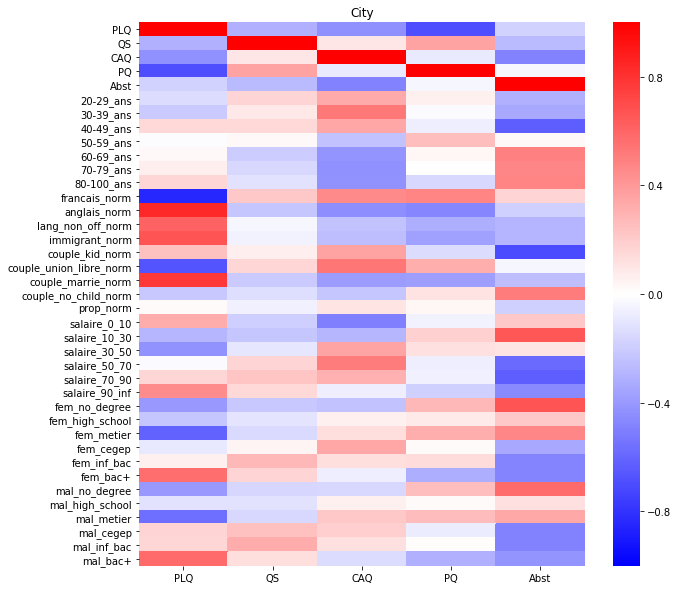

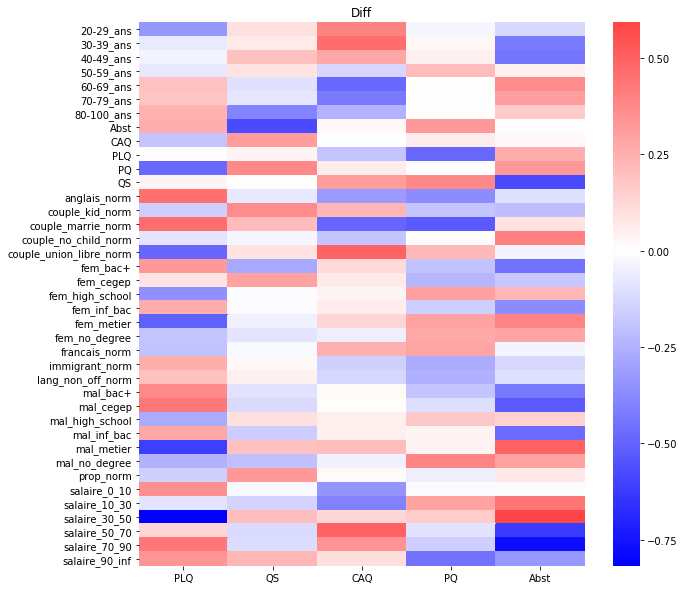

In [52]:
figsize(10,10)
sns.heatmap(VotProfileDF.corr()[MajorParty],vmin=-1,vmax=1,cmap="bwr")
plt.title("Voter Profile")
plt.show()

sns.heatmap(subdf.corr()[MajorParty],vmin=-1,vmax=1,cmap="bwr")
plt.title("City")
plt.show()

sns.heatmap(subdf.corr()[MajorParty]-VotProfileDF.corr()[MajorParty],center=0.0,cmap="bwr")
plt.title("Diff")
plt.show()

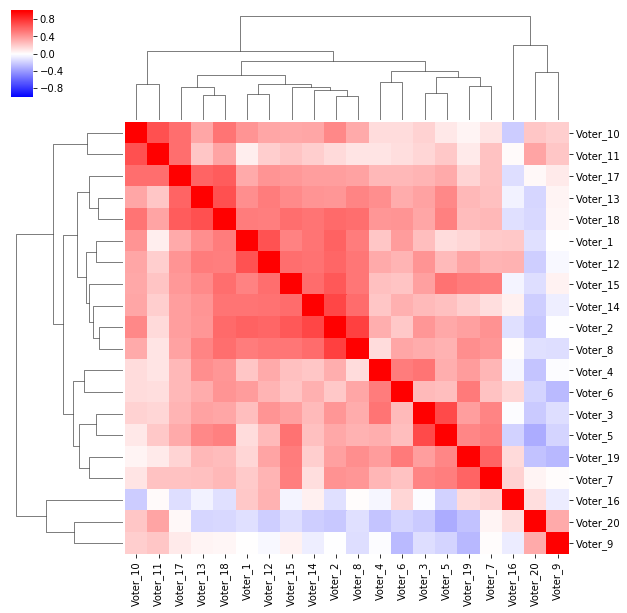

In [53]:
sns.clustermap(VotProfileDF.transpose().corr(),vmin=-1,vmax=1,cmap="bwr")

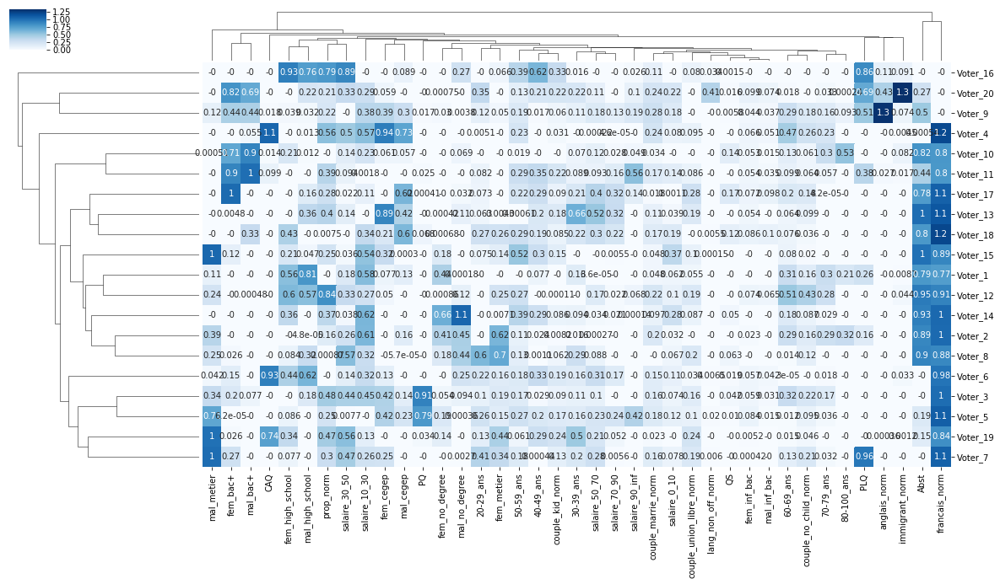

In [54]:
sns.clustermap(VotProfileDF[subdf.columns],annot=True,cmap="Blues",figsize=(20,10),vmin=0)

In [ ]:
toannot = VotProfileDF[subdf.columns].as_matrix()
thresh = 0.2
ntat = []
for i in toannot:
    it = []
    for j in i:
        if j > thresh:
            it.append("%.2f" % (j))
        else:
            it.append("")
    ntat.append(it)
ntat = np.matrix(ntat)
#print(ntat)

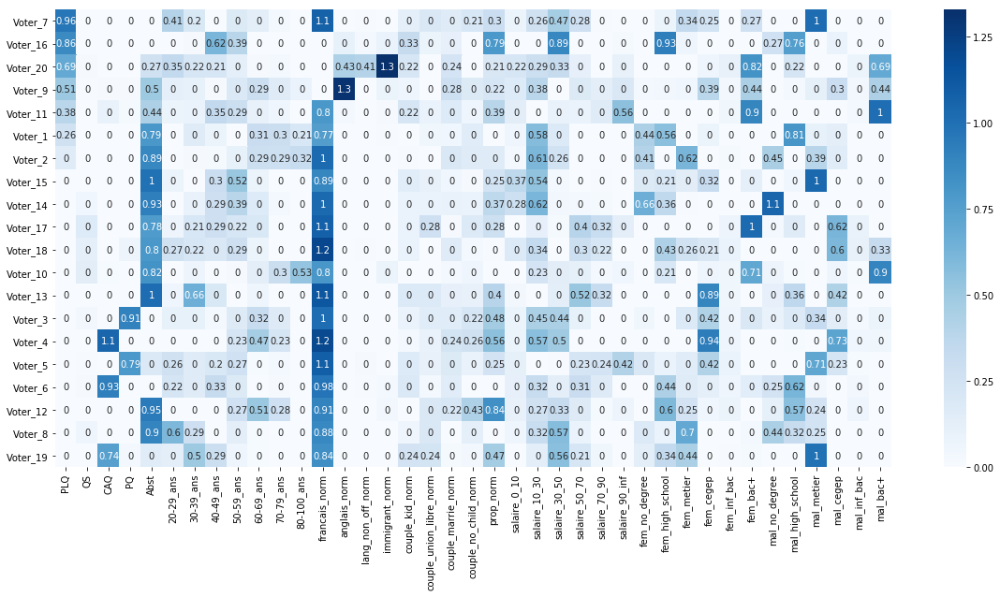

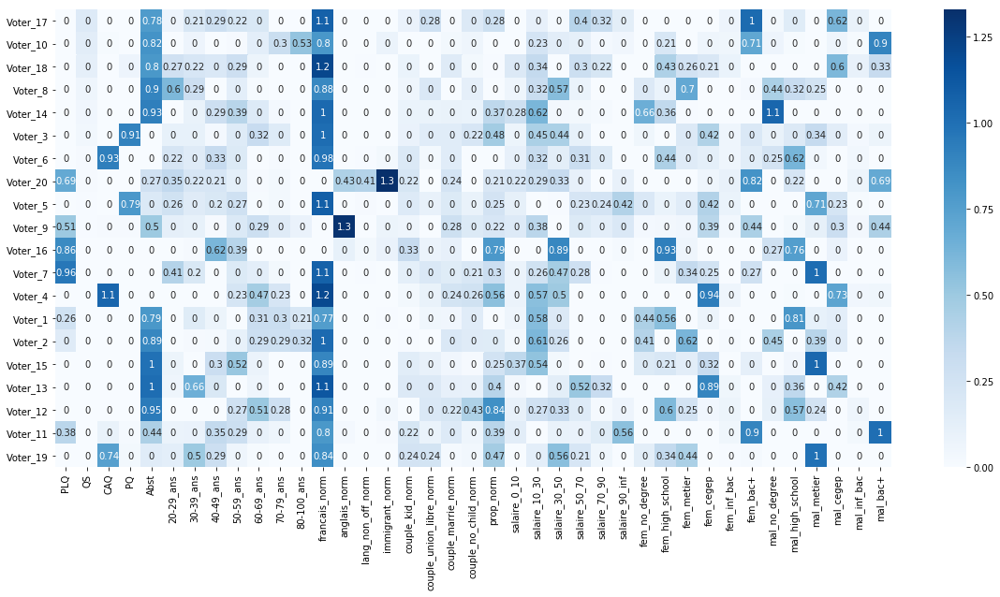

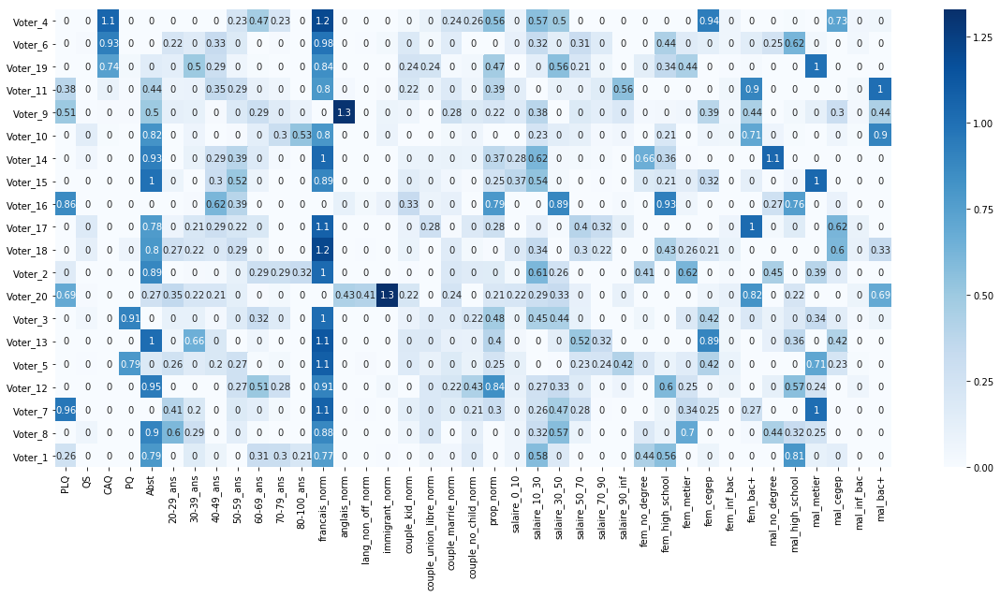

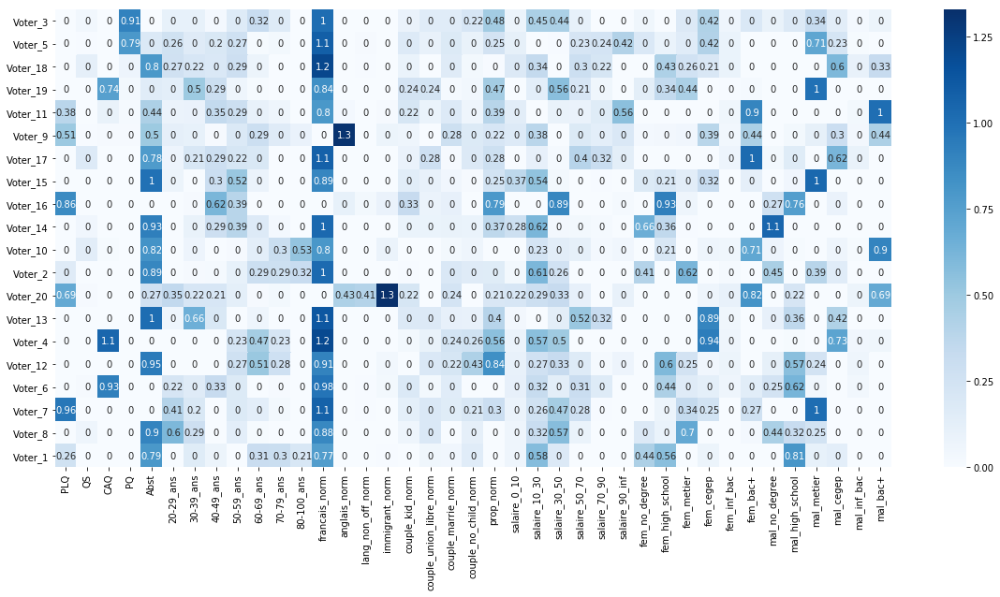

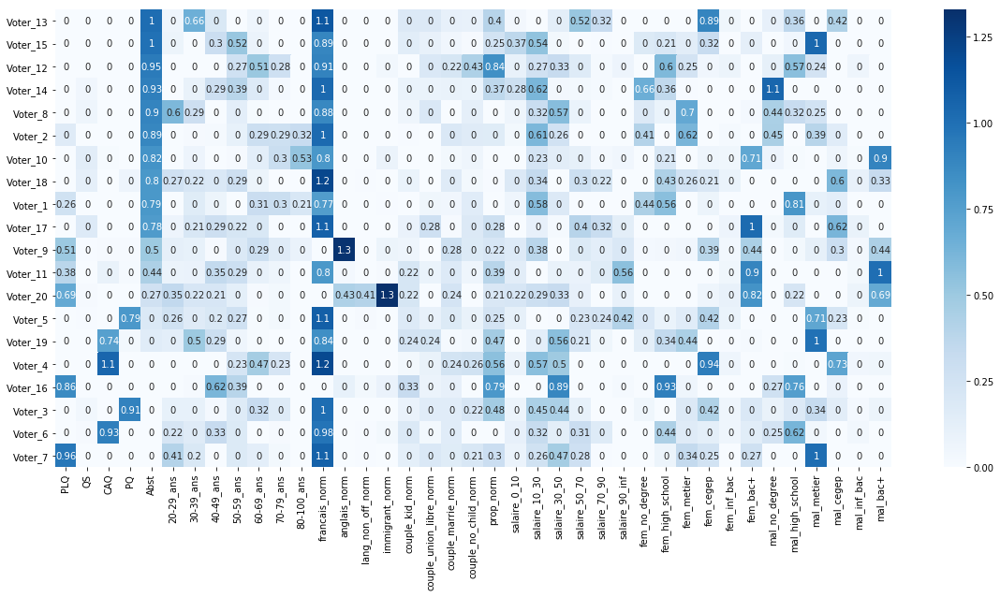

In [60]:
figsize(20,9)



for party in MajorParty:
#for party in list(subdf.columns):
    subdf = VotProfileDF[subdf.columns].sort_values(by=party,ascending=False)
    sns.heatmap(subdf ,vmin=0,cmap="Blues",annot=subdf[subdf > 0.2].fillna(0))
    plt.show()
    #break

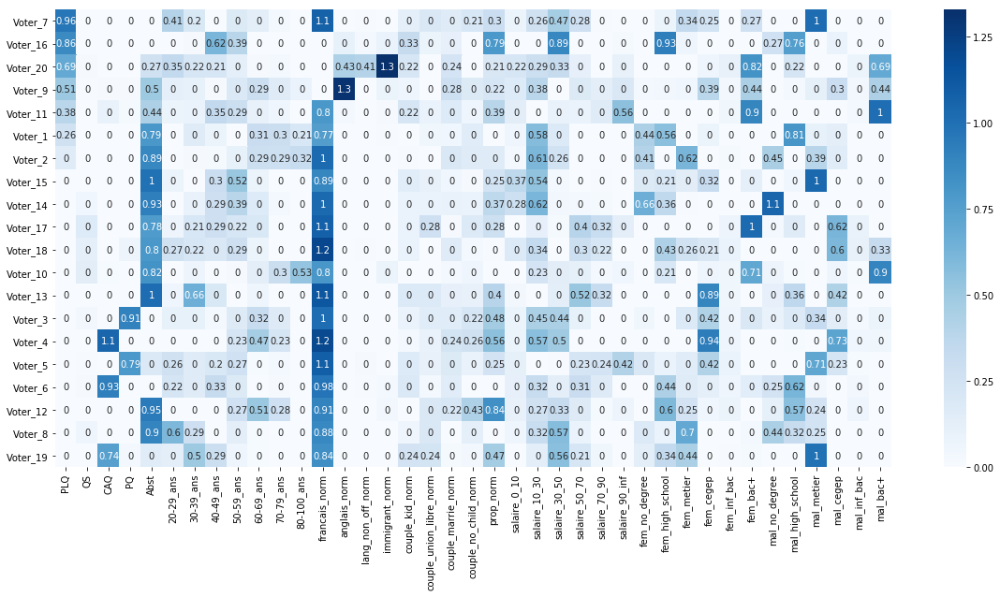

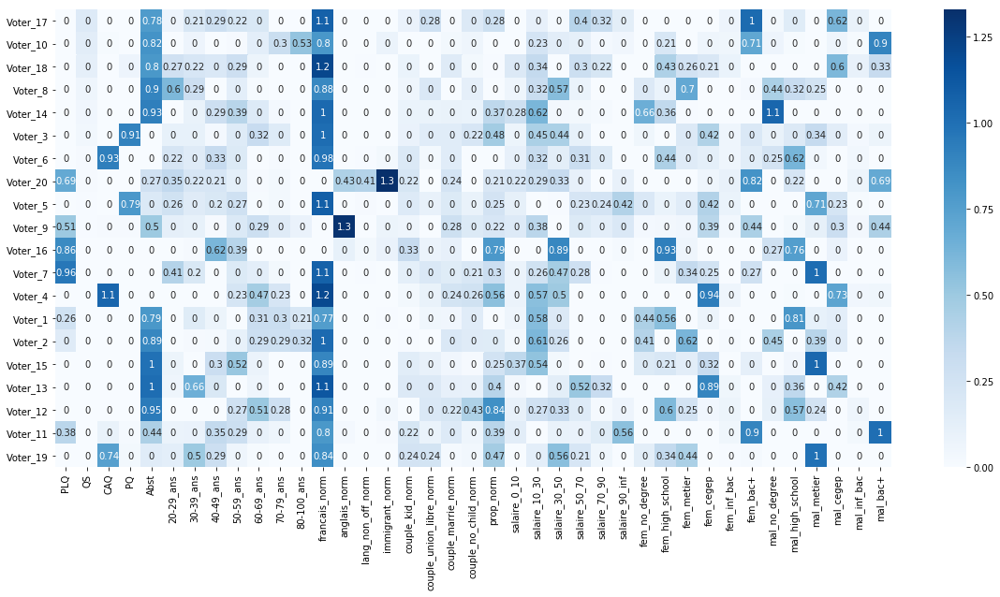

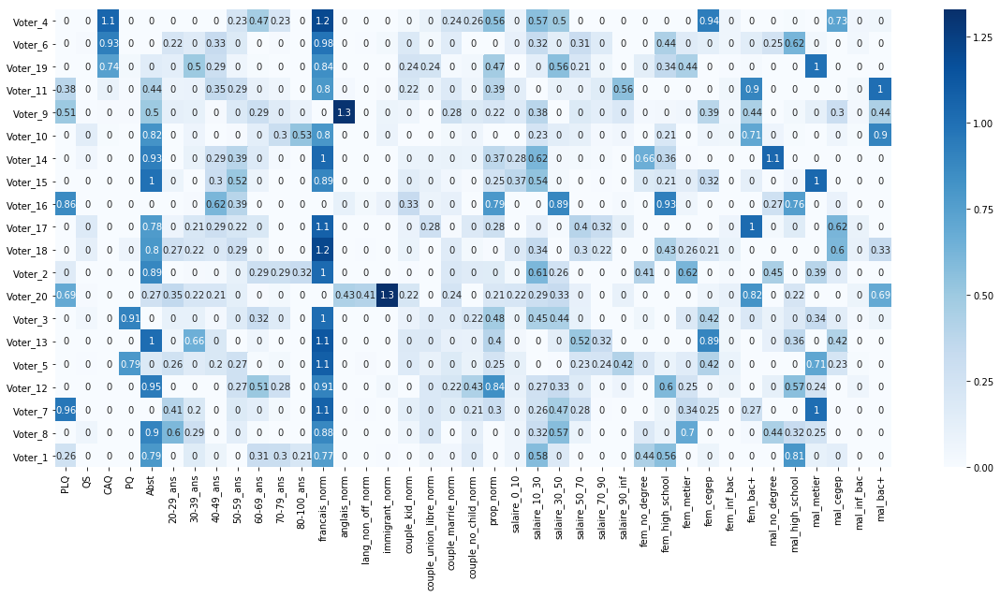

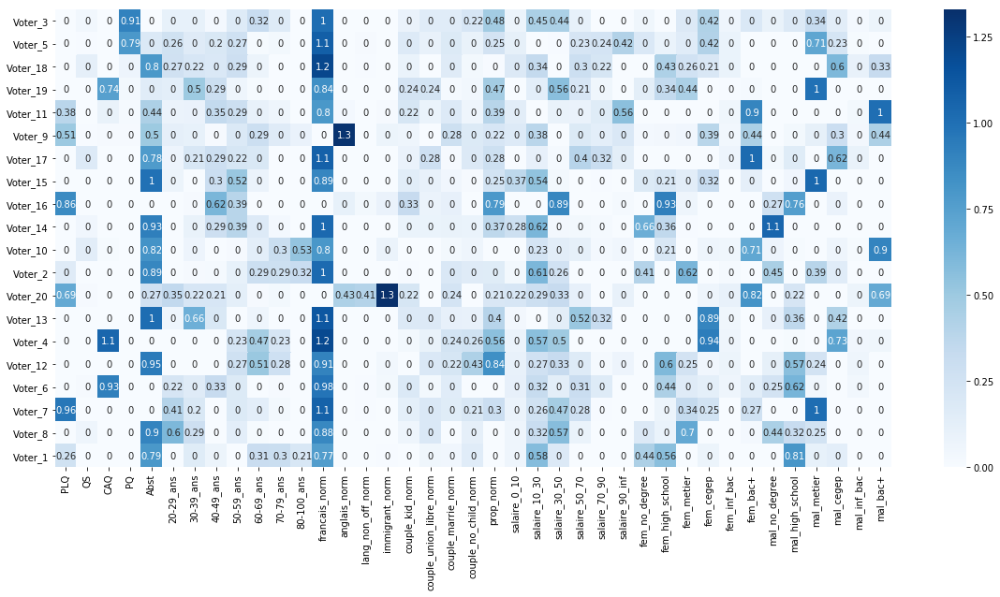

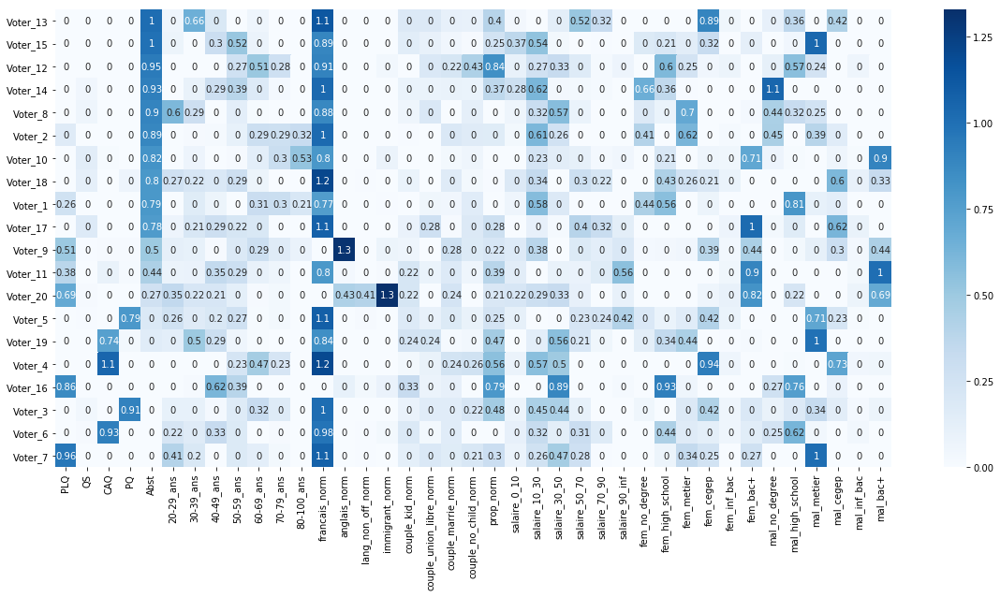

...

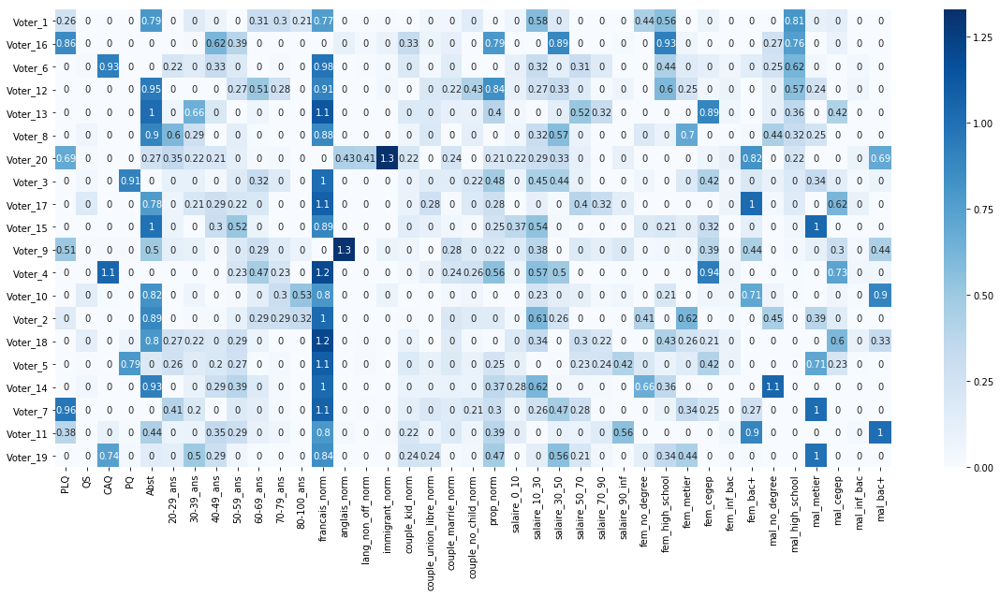

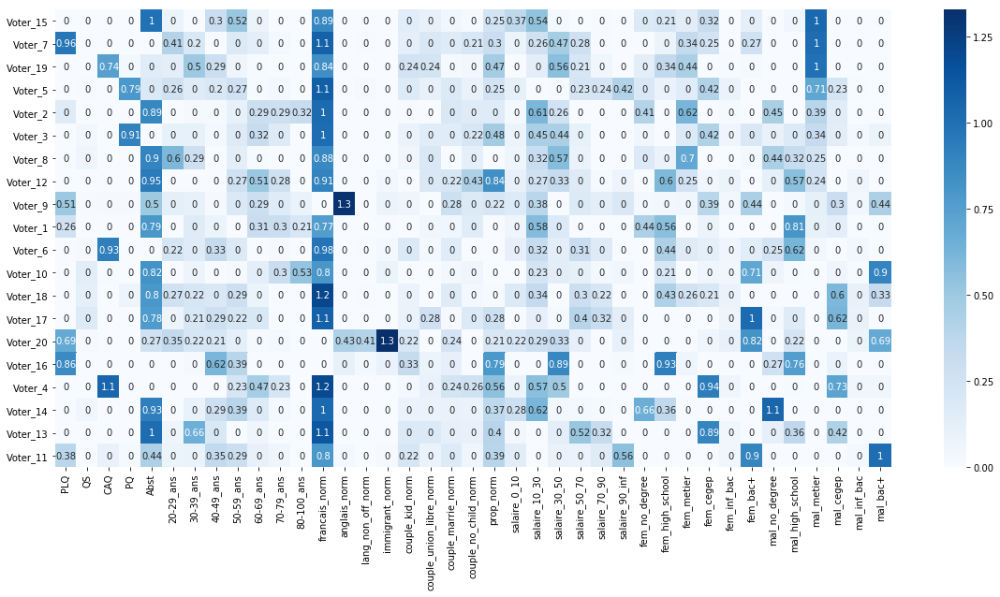

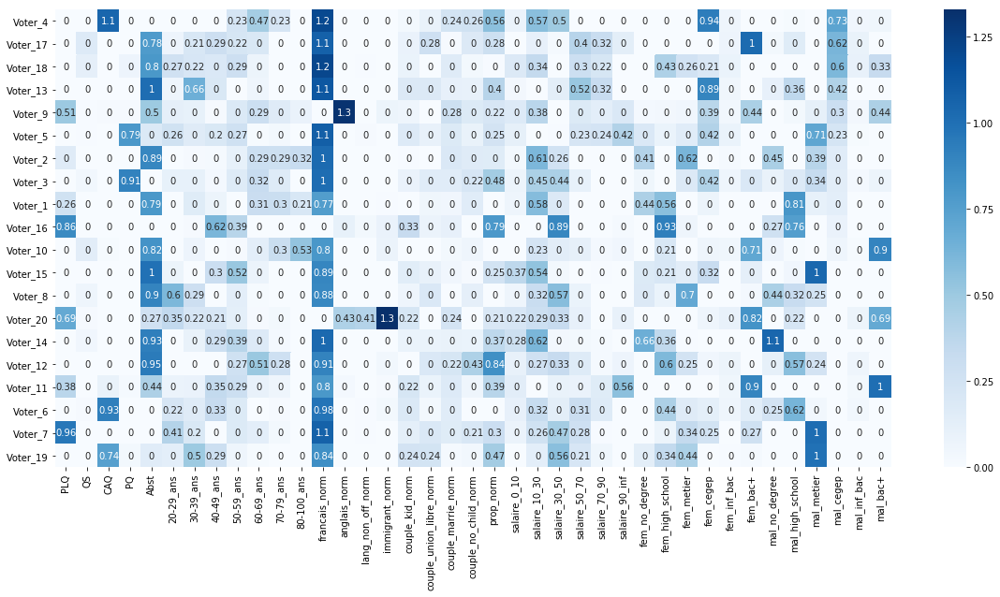

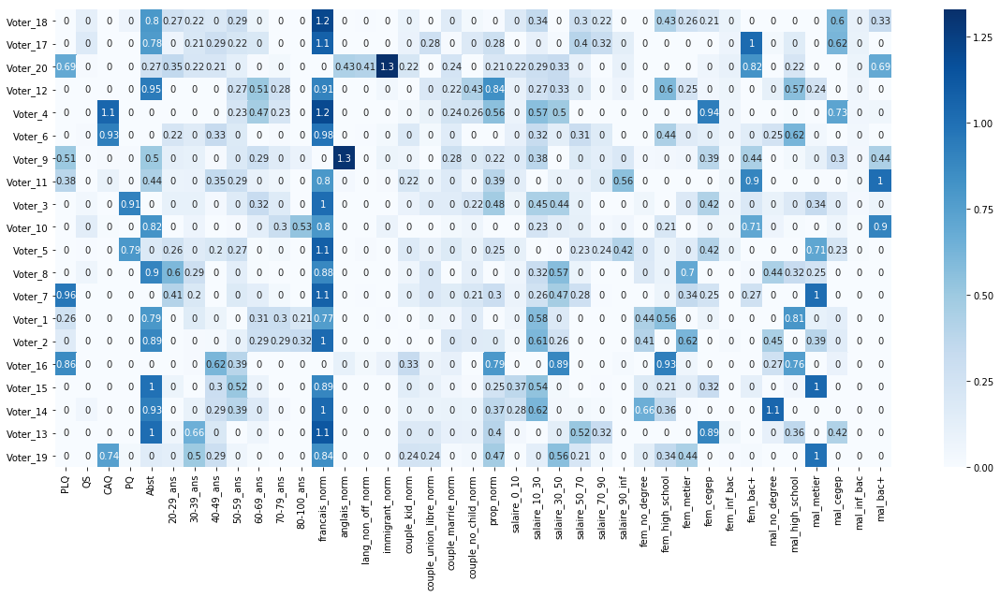

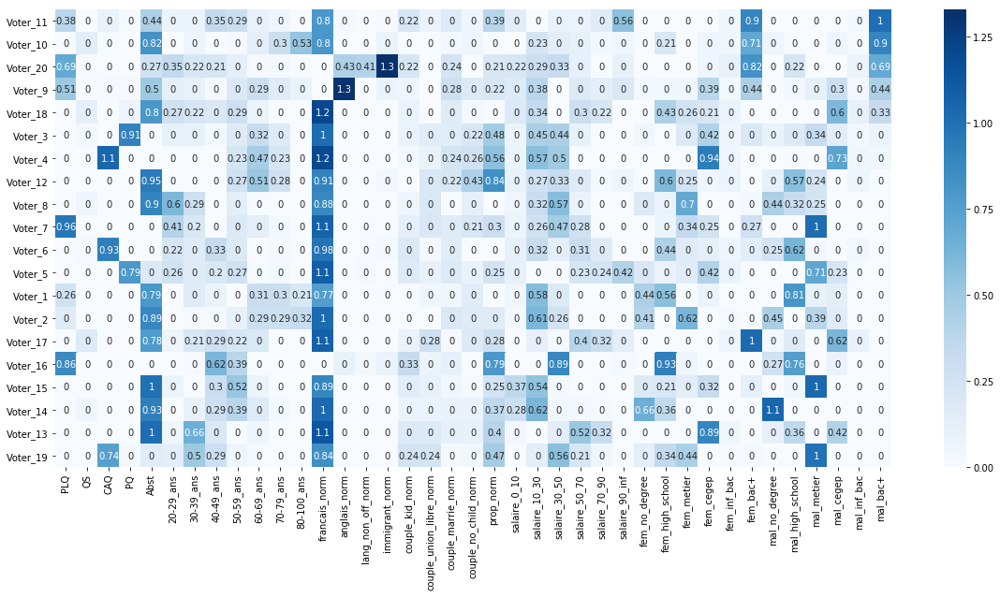

In [57]:
figsize(20,9)
#for party in MajorParty:
for party in list(subdf.columns):
    subdf = VotProfileDF[subdf.columns].sort_values(by=party,ascending=False)
    sns.heatmap(subdf ,vmin=0,cmap="Blues",annot=subdf[subdf > 0.2].fillna(0))
    plt.show()

In [58]:
for t in Merge.columns:
    break
    print(t)

In [59]:
die

NameError: name 'die' is not defined

In [ ]:
model = Sequential()

Number_elector = 8

zero_cst = min_max_norm(min_value=0.0, max_value=1.0, rate=1.0, axis=0)
zero_one = non_neg()

model.add(
    Dense(units=Number_elector, input_dim=len(subdf),kernel_constraint=zero_one,use_bias=False)
    )

model.add(
    Dense(len(subdf.columns),kernel_constraint=zero_one,use_bias=False)
)


for k in range(0,20):
    layw = model.layers[1].get_weights()
    for i in range(Number_elector):
        layw[0][i] -= np.min(layw[0][i])
        layw[0][i][0:len(MajorParty)] /= np.sum(layw[0][i][0:len(MajorParty)])
    model.layers[1].set_weights(layw)
    #sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
    
    model.compile(optimizer=keras.optimizers.Adam(),loss='mean_squared_error')

    hist= model.fit(x_train, y_train, epochs=1000,verbose=0)
    
    
    
    los = hist.history["loss"]
    figsize(8,8)
    plt.plot(range(0,len(los)),los)
    plt.show()